# Building a Reinforcement Learning-based Racing Game in Python with Pytorch
Reading time: 10-15 minutes.

## Abstract

This tutorial guides you through developing a simple car racing game in Python, where a car learns to race around a track using reinforcement learning. Utilizing PyGame with Pytorch, we'll create an interactive environment where the AI progressively improves its lap times through trial and error. Specifically, we will be using PPO for our learning algorithm. This project is an excellent introduction to the concepts of reinforcement learning and game development with Python. The majority of code from this tutorial can be reused to help you implement a Reinfocement Learning Agent in your own game!

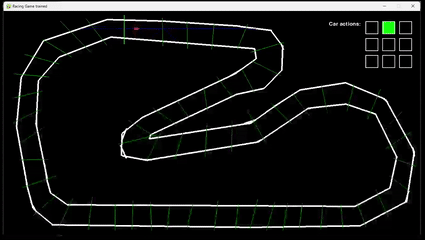

## Table of Contents

1. Learning Objectives
2. Understanding Reinforcement Learning
   - Brief Overview of Reinforcement Learning Concepts
   - How Reinforcement Learning Applies to Our Racing Game
3. Setting up the Python Environment
4. Creating the Racing Game Environment
   - Creating a Simple 2D Racing Game
   - Creating the Track and Car
   - Controlling the Car
   - Implementing Collision Detection
5. Modifying the Game to Work with RL
   - Giving Our Agent a Way to 'See'
   - Defining 'Game State'
   - Rewarding Our Agent
   - Visualizing the Agent's Training Performance
6. Implementation of Reinforcement Learning Model (PPO)
7. Training the Agent
   - Initialising Our Model and Hyperparameters
   - Training Parameters
   - Training Loop
8. Results
   - AI Playing Our Game
   - Further Remarks
9. References

## Learning Objectives:
- Understand the basics of reinforcement learning.
- Learn how to implement a game environment with PyGame.
- Utilize Pytorch for developing a reinforcement learning model, specifically PPO.
- Visualize the learning progress using Matplotlib.
- Saving and then running the trained model

## Understanding Reinforcement Learning

### Brief Overview of Reinforcement Learning Concepts

Reinforcement Learning (RL) is a type of machine learning where an agent learns to make decisions by taking actions in an environment to achieve some kind of goal. The agent learns from the reward it receives from its actions, rather than from being told explicitly what to do, through a process of trial and error. This learning process is driven by the feedback received in the form of rewards or punishments, which guide the agent towards beneficial behavior over time.

The key components of an RL system include:
- **Agent**: The decision-maker.
- **Environment**: Everything the agent interacts with.
- **Action**: All possible moves the agent can make.
- **State**: The current situation in the environment, what the agent observers.
- **Reward**: Feedback based on the agent's performance to evaluate its last action.
- **Policy** The agent's decion making stratergy, mapping states to actions.

The agent's goal is to learn a policy, a strategy for choosing actions based on states, that maximizes the cumulative reward over time. This involves balancing exploration (trying new things) with exploitation (sticking with what seems to work best).


### How Reinforcement Learning applies to our racing game

In the context of our racing game, Reinforcement Learning can be used to develop a highly skilled AI that can race around tracks as fast as possible. 

Here’s how RL components map to our game:
- **Agent**: The racing car controlled by AI.
- **Environment**: The racetrack, including walls, waypoints, the car, ect.
- **Action**: Moves that affect throttle and steering.
- **State**: The current situation of the race. For example, the car's position, velocity, and proximity to walls.
- **Reward**: Punishments for hitting walls and rewards for hitting waypoint.
- **Policy** A neural network that maps game state to action.
- 
Through continuous interaction with the game environment, the AI agent learns a policy that maximizes its received reward. If done right, we will be able to train an AI Agent to optimally race around the track.

```mermaid
graph LR
    A[Agent] -- action --> E[Environment]
    E -- state --> A
    E -- reward --> A

## Setting up the python Environment

Importing Pygame, PyTorch, Matplotlib, Numpy, and other necessary libraries:

In [4]:
import torch # For implementing reinforcement learning
import torch.nn as nn
from torch.distributions import Categorical

import pygame # For running our game
from shapely.geometry import LineString, Point # Used for shapes and collision detection in the game

import numpy as np  # For numerical operations
import math # For mathmatical operations
import random # For random numbers
import matplotlib.pyplot as plt  # For visualizing data
from IPython import display # For formatting console outputs

import gameConfig # External python file with wall and waypoint coordinates

pygame 2.5.2 (SDL 2.28.3, Python 3.11.0)
Hello from the pygame community. https://www.pygame.org/contribute.html


## Creating the racing game environment

### Creating a simple 2D racing game

Below is a video of the game that we, and our AI agent, will be playing.
- The User or AI-Agent control's the car (red)
- You **win** the game by completing a lap, by passing through each waypoint (green) in the correct order
- You **loose** the game if you hit a barrier (white)

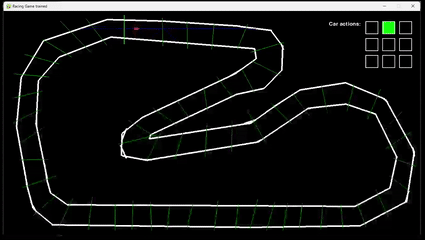

### Creating the track and car

First of all, we need to add a car, track, and waypoints to our game.
- We can draw walls on the screen as a series of connect lines
- Similarly, waypoints can be represented as lines that cover the width of certain parts of the track
- Our car will be respresented as a small rectangle

We will start by defining the size of the screen, and scalling our walls and waypoints to this size.

Wall and Waypoint coordinates from https://github.com/Bobingstern/gym-CarDrifting2D

In [5]:
# Start pygame
pygame.init()

# Screen dimensions
downScaleFactor = 1.2
screen_width, screen_height = 1600 / downScaleFactor, 860 / downScaleFactor
screen = pygame.Surface((screen_width, screen_height))
Xoffset = -150
Yoffset = -140

# Scale down the walls to fit on the screen
# Wall coordinates from https://github.com/Bobingstern/gym-CarDrifting2D
scaled_walls = [[(wall[0] + Xoffset) / downScaleFactor,
                 (wall[1] + Yoffset) / downScaleFactor,
                 (wall[2] + Xoffset) / downScaleFactor,
                 (wall[3] + Yoffset) / downScaleFactor] for wall in gameConfig.walls]

# Scale down the waypoints to fit on the screen
# Waypoint coordinates from https://github.com/Bobingstern/gym-CarDrifting2D
scaled_waypoints = [[(waypoint[0] + Xoffset) / downScaleFactor,
                     (waypoint[1] + Yoffset) / downScaleFactor,
                     (waypoint[2] + Xoffset) / downScaleFactor,
                     (waypoint[3] + Yoffset) / downScaleFactor] for waypoint in gameConfig.waypoints]

Next we set the inital properties of the car and the game. 

Lets also create a function to reset these properties to their initial values. Later, we will reset the game after a win/loss

In [6]:
# Car properties
car_size = 15/downScaleFactor
velocity = 0
drag = 0.9
max_velocity = 10
angular_velocity = 0
angular_drag = 0.6
max_angular_velocity = 2
throttle_power = 0.6
steering_power = 0.8
# Car position
angle = -90 
car_pos = [(650 + Xoffset)/downScaleFactor, (200 + Yoffset)/downScaleFactor]
# Game properties
next_waypoint_index = 0
gameLoops = 0
playingGame = True

# Reset the game to the start state, we will use this after the game is won or lost
def reset_game():
    global car_pos, vel_x, vel_y, angular_vel, angle, car_rect, next_waypoint_index, gameLoops, playingGame
    # Reset all non-constant car properties and game properties
    car_pos = [(650 + Xoffset)/downScaleFactor, (200 + Yoffset)/downScaleFactor]
    velocity = 0
    angular_velocity = 0
    angle = -90
    next_waypoint_index = 0
    gameLoops = 0
    playingGame = True

Finally, we will create a function that draws the current state of the game (car, walls, and waypoints). We will later call this function every frame (update) of the game
- Walls are drawn as many white lines
- Waypoints are drawn as many green lines
- The car is drawn as a thick red line

In [7]:
def draw_game():
    # Paint the whole screen black (new frame)
    screen.fill(gameConfig.black)

    # Draw walls (lots of white lines)
    for wall in scaled_walls:
        pygame.draw.line(screen, gameConfig.white, wall[:2], wall[2:], 5)

    # Draw waypoints (lots of green lines)
    for i in range(len(scaled_waypoints)):
        waypoint = scaled_waypoints[i]
        # Highlight next waypoint
        if(i == next_waypoint_index):
            pygame.draw.line(screen, gameConfig.green, waypoint[:2], waypoint[2:], 2)
        else:
            pygame.draw.line(screen, gameConfig.dark_green, waypoint[:2], waypoint[2:], 2)

    # Draw car
    car_front, car_back = get_car_line()
    pygame.draw.line(screen, gameConfig.red, car_back, car_front, int(car_size/2))

# Use the current position and angle to represent the car
def get_car_line():
    car_direction = (math.sin(math.radians(-angle + 180)), -math.cos(math.radians(-angle + 180)))
    car_front = (car_pos[0] + car_size / 2, car_pos[1] + car_size / 2)
    car_back = (car_front[0] - car_direction[0] * car_size, car_front[1] - car_direction[1] * car_size)
    return car_front, car_back

Lets make sure everything is displayed and setup correctly by running a very simple game loop that only displays the current state of the game

In [8]:
window = pygame.display.set_mode((screen_width, screen_height))
pygame.display.set_caption('Racing Game')

# Reset the game
reset_game()

# Basic game loop that runs for 5 seconds or until quit
while playingGame and gameLoops < 5 * 60:
    if any(event.type == pygame.QUIT for event in pygame.event.get()):
        playingGame = False
    gameLoops += 1
    
    # Draw the game to the screen
    draw_game()

    # Display the screen on the window at 60 FPS
    window.blit(screen, (0, 0))
    pygame.display.flip()
    pygame.time.Clock().tick(60)

pygame.quit()

At this point, our game should:
- Display the car, walls, and waypoints correctly
- But, there is no way to control the car or detect wins/losses

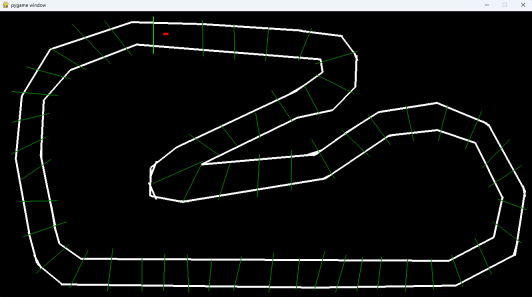

### Controlling the car

Our car has two controls:
- Throttle - acceleration or deceleration of the car, changing the cars velocity over time
- Steering - rotating the car, changing the cars direction over time

That means we have an action space of size 9, for every combination of left/right/no steering and forward/backward/no throttle:
- Action 1 = forward and turn left
- Action 2 = forward
- Action 3 = forward and turn right
- Action 4 = turn left
- Action 5 = do nothing
- Action 6 = turn right
- Action 7 = backward and turn left
- Action 8 = backward
- Action 9 = backward and turn right

We'll create a function that takes in these actions and updates the car's position. We do this in four steps.

Every frame (game update):
1. Update velocities based on the current action
2. Limit the velocities to be less than the maximum velocities
3. Based on the velocity, move the car's position
4. Apply drag to the velocities

In [9]:
# actions, a 9-tuple where: 
# actions[0] = forward and turn left
# actions[1] = forward
# actions[2] = forward and turn right
# actions[3] = turn left
# actions[4] = do nothing
# actions[5] = turn right
# actions[6] = backward and turn left
# actions[7] = backward
# actions[8] = backward and turn right

def update_car_position(actions):
    global velocity, angular_velocity, angle

    if actions[0] > 0 or actions[1] > 0 or actions[2] > 0:  # accelerate forward
        velocity += throttle_power
    if actions[6] > 0 or actions[7] > 0 or actions[8] > 0:  # accelerate backwards
        velocity -= throttle_power
    if actions[0] > 0 or actions[3] > 0 or actions[6]:  # turn left
        angular_velocity += steering_power
    if actions[2] > 0 or actions[5] > 0 or actions[8]:  # turn right
        angular_velocity -= steering_power

    # Apply limit to velocities
    velocity = max(-max_velocity, min(max_velocity, velocity))
    angular_velocity = max(-max_angular_velocity, min(max_angular_velocity, angular_velocity))

    # Update car's position
    vel_x = velocity * math.sin(math.radians(angle))
    vel_y = velocity * math.cos(math.radians(angle))
    car_pos[0] += vel_x
    car_pos[1] += vel_y
    angle += angular_velocity

    # Apply drag to velocities
    velocity *= drag
    angular_velocity *= angular_drag

For now, the user will control the car.

The function below sets the actions based on the user's input (using the arrow keys). 

Later, we will want our AI-Agent to decide the car's actions.

In [10]:
def get_user_controls(actions):
    # Get user input
    keys = pygame.key.get_pressed()

    # accelerate forward
    if keys[pygame.K_UP]:  
        if keys[pygame.K_LEFT]:    # forwards left
            actions[0] = 1
        elif keys[pygame.K_RIGHT]: # forwards right
            actions[2] = 1
        else:                      # forwards only
            actions[1] = 1
        
    # accelerate backwards
    elif keys[pygame.K_DOWN]:  
        if keys[pygame.K_LEFT]:    # backwards left
            actions[6] = 1
        elif keys[pygame.K_RIGHT]: # backwards right
            actions[8] = 1
        else:                      # backwards only
            actions[7] = 1
        
    elif keys[pygame.K_LEFT]:      # turn left
        actions[3] = 1
    elif keys[pygame.K_RIGHT]:     # turn right
        actions[5] = 1
    else:                          # do nothing
        actions[4] = 1

To visualse the car's actions, we will display the selected action as a grid in the top-right of the screen. This function will display this grid:
- the highlighted square (green) is the car's currently decided action
- the position of the square in the grid indicates the direction the car will take

For example
- The center square is 'no action'
- the top left square is 'forward and turn left'
- the centre right square is 'turn right'

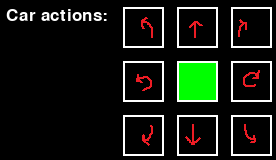

In [11]:
def draw_actions(actions):
    # Grid represeting current chosen action
    gridX = screen_width - 210/downScaleFactor
    gridY = 40/downScaleFactor
    gridSpacing = 15/downScaleFactor
    outer_square = 50/downScaleFactor
    inner_square = 45/downScaleFactor

    # Text 'Car actions:'
    pygame.font.init()
    font = pygame.font.SysFont(None, int(30/downScaleFactor))
    text = font.render("Car actions:", True, gameConfig.white)
    screen.blit(text, (gridX - 140/downScaleFactor, gridY))
    
    # Display grid
    for row in range(3):
        for col in range(3):
            action_index = row * 3 + col
            rectOutside = pygame.Rect(gridX + col * (outer_square + gridSpacing),
                                      gridY + row * (outer_square + gridSpacing),
                                      outer_square, outer_square)
            rectInside = pygame.Rect(gridX + col * (outer_square + gridSpacing) + (outer_square - inner_square)/2,
                                     gridY + row * (outer_square + gridSpacing) + (outer_square - inner_square)/2,
                                     inner_square, inner_square)
            color = gameConfig.green if actions[action_index] == 1 else gameConfig.black
            pygame.draw.rect(screen, gameConfig.white, rectOutside)
            pygame.draw.rect(screen, color, rectInside)

Lets test our current progress with a simple game loop, this time, including the controls for the car.

In [12]:
window = pygame.display.set_mode((screen_width, screen_height))
pygame.display.set_caption('Racing Game with controls')

# Reset the game
reset_game()

# Basic game loop that runs for 30 seconds or until quit
while playingGame and gameLoops < 30 * 60:
    if any(event.type == pygame.QUIT for event in pygame.event.get()):
        playingGame = False
    gameLoops += 1
    
    # Throttle and Steering actions
    actions = np.zeros(9)

    # Collect actions from user
    get_user_controls(actions)

    # Update the car's position
    update_car_position(actions)

    # Draw the game to the screen
    draw_game()
    # Draw actions grid to the screen
    draw_actions(actions)

    # Display the screen on the window at 60 FPS
    window.blit(screen, (0, 0))
    pygame.display.flip()
    pygame.time.Clock().tick(60)

pygame.quit()

At this point, our game should:
- Display the car, walls, and waypoints correctly
- Have the user control the car
- But, there is no way to detect wins/losses

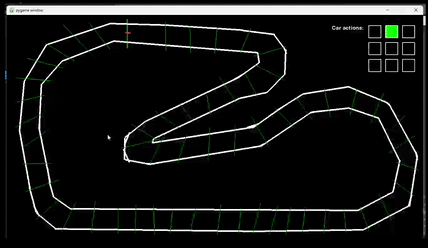

### Implementing collision detection

Our game needs some rules:
- Hitting a barrier **looses** the game
- Finishing a lap (hitting all waypoinys in the correct order) **wins** the game

The following two functions are used to detect for collisions with walls or waypoints respectively

In [13]:
# See if car intersects any of the walls, return true if a collision is detected
def check_for_wall_collision():
    car_front, car_back = get_car_line()
    return any(LineString([car_back, car_front]).intersects(LineString([(wall[0], wall[1]), (wall[2], wall[3])])) for wall in scaled_walls)

# See if car intersects any of the waypoints, return the index of the waypoint if a collision is detected
def check_for_waypoints_collision():
    car_front, car_back = get_car_line()
    for i in range(len(scaled_waypoints)):
        waypoint = scaled_waypoints[i]
        if LineString([car_back, car_front]).intersects(LineString([(waypoint[0], waypoint[1]), (waypoint[2], waypoint[3])])):
            return i
    return -1

Lets implement a complete version of our game loop, with car controls, collision detection, and graphics.

In [14]:
window = pygame.display.set_mode((screen_width, screen_height))
pygame.display.set_caption('Racing Game with controls and collisions')

# Reset the game
reset_game()

# Basic game loop that runs for 60 seconds or until quit
while playingGame and gameLoops < 60 * 60:
    if any(event.type == pygame.QUIT for event in pygame.event.get()):
        playingGame = False
    gameLoops += 1
    
    # Throttle and Steering actions
    actions = np.zeros(9)

    # Collect actions from user
    get_user_controls(actions)

    # Update the car's position
    update_car_position(actions)

    # Check collision with walls
    if check_for_wall_collision():
        print("Game lost! You hit a barrier.")
        reset_game()

    # Check collision with waypoints
    waypoint_index = check_for_waypoints_collision()
    if waypoint_index != -1:
        # If hit the next waypoint
        if waypoint_index == next_waypoint_index:
            next_waypoint_index += 1
            # Win if last waypoint hit
            if next_waypoint_index == len(scaled_waypoints):
                print("Game won! You completed a lap.")
                reset_game()

    # Draw the game to the screen
    draw_game()
    # Draw actions grid to the screen
    draw_actions(actions)
    
    # Display the screen on the window at 60 FPS
    window.blit(screen, (0, 0))
    pygame.display.flip()
    pygame.time.Clock().tick(60)

pygame.quit()

At this point, our game should:
- Display the car, walls, and waypoints correctly
- Have the user control the car
- Win the game on lap completion
- Loose the game on barrier collision

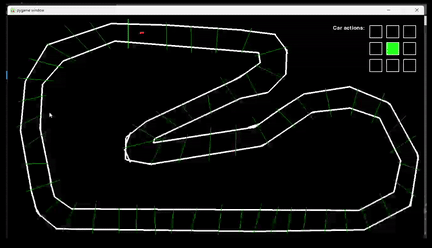

We have finished making this simple racing game! 🎉

You are encouraged to **Give it a go yourself!**

## Modifying the game to work with RL

### Giving our Agent a way to 'see'

First, we need to give the agent a way to 'see'. Effectively, what the agent 'sees'is the agents input and is how the agent expirences the environment. 

To do this, using the code below, we will project a number of raycasts from the car. 

We will later use the raycast distances as  perceptions for our agent.

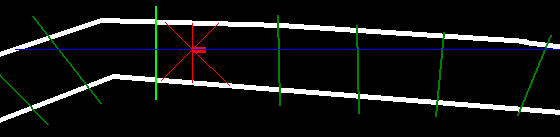

In [15]:
ray_angles = [0, 45, 90, 135, 180, 225, 270, 315] # Angles, from the car, where we project the raycasts
raycasts = [] # Details about each project raycast, each raycast is represented as (start point, distance, end point)
ray_max_distance = screen_width

def project_raycasts():
    # Store both startpoint, distance, endpoint for each ray that hits a wall
    raycasts.clear()
    for ray_angle in ray_angles:
        # Project a ray from the car at the given angle, and save the results
        ray_start = (car_pos[0] + car_size / 2, car_pos[1] + car_size / 2)
        startpoint, distance, endpoint = calculate_raycast(ray_start, -angle, scaled_walls, ray_angle)
        raycasts.append((startpoint, distance, endpoint))

# Function to calculate raycast intersections
def calculate_raycast(ray_start, angle, obstacle_lines, ray_angle):
    # Project very long raycast (with length of ray_max_distance)
    ray_direction = (math.sin(math.radians(angle + ray_angle)), -math.cos(math.radians(angle + ray_angle)))
    ray_end = (ray_start[0] + ray_direction[0] * ray_max_distance, ray_start[1] + ray_direction[1] * ray_max_distance)
    ray_line = LineString([ray_start, ray_end])
    # Keep track of the closest intersection
    closest_distance = ray_max_distance
    closest_point = ray_end
    # Find intersction of this long raycast with all obstacles, choose intersection with shortest distance
    for obstacle in obstacle_lines:
        obstacle_line = LineString([(obstacle[0], obstacle[1]), (obstacle[2], obstacle[3])])
        if ray_line.intersects(obstacle_line):
            intersection_point = ray_line.intersection(obstacle_line)
            distance = Point(ray_start).distance(intersection_point)
            if distance < closest_distance:
                closest_distance = distance
                closest_point = (intersection_point.x, intersection_point.y)
    # Return raycast
    return ray_start, closest_distance, closest_point

def draw_raycasts():
    # Draw raycasts as lines projecting from the car
    for startpoint, distance, endpoint in raycasts:
        rayColour = gameConfig.blue
        if distance < 50:
            rayColour = gameConfig.red
        pygame.draw.line(screen, rayColour, startpoint, endpoint, 1)

# Call the function once to populate the raycasts array
reset_game()
project_raycasts()

### Defining 'Game State'

The 'Game State' is a snapshot of the game from the perspective of the agent at any given moment, essentially the agent's perceptions of its surroundings

In Reinforcement Learning, the game state is crucial as it forms the basis upon which the agent assesses its environment, decides an action, and then learns from the outcome of that action based on the new game state it encounters. Usually, the game state includes any variables that change over time, such as the agent's position, velocity, and the distances to nearby obstacles. Static elements, like walls or waypoints, are excluded because they don't influence the decision-making process from moment to moment.

For simplicity, our game state will only consist of the 8 raycasts we are projecting from the car. However, you could choose to include further variables/observations such as:
- The car's x position
- The car's y position
- The car's velocity
- The car's angular velocity
- The car's angle

When deciding how to represent the game state, it is a tradeoff between complexity, performance, and training speed. For example:
- Less observations tends to mean our agent is more simple, as it has less to work with, but also means the agent is more likely to learn faster and not be lead astray when training (because the exploration space will be smaller)
- More observations does the opposite, our agent can exhibit more complex behaviour but will probably take longer to learn.

The process of defining the game state is very similar to feature selection in other Machine Learning pipelines. In reality, you want to provide the mimunum number of features/observations for the agent to complete the task to a satisfactory level.

Normalization is critical here to ensure the inputs are on a consistent scale, improving the neural network's (our later reinforcement learning model's) ability to make small adjustments to the agent's behaviour. If the game state was not normalized then small tweaks to the neural network often cause the agent to over/undereact to the game states.

In [16]:
# Get the number of inputs from our agent 
# (must be the same as the number of input neurons in the later neural network)
def get_game_state_size():
    return len(raycasts)

# Get the state of the game (from the car's perspective)
def get_game_state(): 
    gameState = []    
    # Observe normalized raycast distances
    for startpoint, distance, endpoint in raycasts:
        gameState.append(max(0, min(1, distance/ray_max_distance)))

    # Return game state
    return np.array(gameState, dtype=float)

### Rewarding our agent

We will modify slightly how our game works. Instead of a constant game loop, we transition to a step-by-step game, where each step includes:

1. Getting actions (from either the agent or the user)
2. Playing one game step with these actions to control the car
3. Returning the step's reward and indicating if the game has finished

The agent's goal is to maximize its total reward. To guide its learning, we:
- **Encourage desirable behaviors** by offering positive rewards
- **Discourage undesirable behaviors** by imposing negative rewards (punishments).

Below, the reward mechinism is defined as such:
- Small punishment (reward -= 0.01) always, to discourage doing nothing and also to encourage finishing the game sooner
- punishment (reward -= 1) for hitting a wall, to discourage loosing the game
- reward (reward += 1) for hitting the next waypoint, to encourage going forward around the track
- large reward (reward += 3 + (1000 / gameLoops)) for finishing the lap, to encourage winning as fast as possiblebleible

In [17]:
def play_game_step(actions):
    global gameLoops, next_waypoint_index, playingGame
    gameLoops += 1    
    if any(event.type == pygame.QUIT for event in pygame.event.get()):
        playingGame = False

    reward = 0
    
    if not playingGame:
        # Return reward of 0 and that the game has ended
        return reward, True
        
    # Update the car's position
    update_car_position(actions) 

    # Project ray casts from car
    project_raycasts()

    # Small punishment always, to discourage doing nothing and also to encourage finishing the game sooner
    reward -= 0.01
    
    # Check collision with walls
    if check_for_wall_collision():
        # punishment from hitting a barrier, to discourage loosing the game
        reward -= 1
        # Return reward and that the game has ended
        return reward, True

    # Check collision with waypoints
    waypoint_index = check_for_waypoints_collision()
    if waypoint_index != -1:
        # If hit the next waypoint
        if waypoint_index == next_waypoint_index:
            next_waypoint_index += 1
            # reward from hitting the next waypoint
            reward += 1
            # Win if last waypoint hit
            if next_waypoint_index == len(scaled_waypoints):
                # Huge reward from hitting the next waypoint (more for completing lap faster)
                reward += 3 + (1000 / gameLoops)
                # Return reward and that the game has ended
                return reward, True


    # Draw the game to the screen
    draw_game()
    # Draw actions grid to the screen
    draw_actions(actions)
    # Draw raycasts on the screen
    draw_raycasts()

    # Display the screen on the window at 60 FPS
    window.blit(screen, (0, 0))
    pygame.display.flip()
    #pygame.time.Clock().tick(60) # Comment out this line to speed up training

    # Return reward and that the game has not ended
    return reward, False

### Visualizing the Agent's training performance

To visulize the agent perfomance over time when training, other then staring at the agent's futile racing attempts, we will plot the total reward the agent receives each game over time. If we do everything right, hopefully this graph will trend upwards as the agent performs better and better over time.

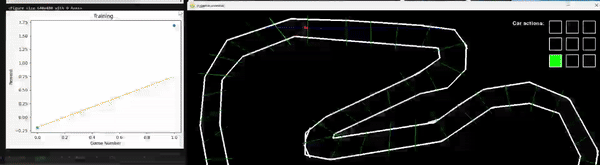

- Rewards per game is shown as a scatter plot (blue)
- The average reward over time is plotted as a line (orange)

Because we will be training on a large number of games, we will take the average reward from regular intervals of play (i.e., every 10 games).

In [18]:
plt.ion()
def plot_training(game_numbers, game_rewards):
    display.clear_output(wait=True)
    display.display(plt.gcf())
    plt.clf()
    plt.title('Training...')
    plt.xlabel('Game Number')
    plt.ylabel('Reward')
    # Plot rewards as a scatter plot
    plt.scatter(game_numbers, game_rewards, label='Reward per Game')
    # Plot avg_rewards as a line plot
    avg_rewards = []
    sum = 0.0
    for i in range(len(game_rewards)):
        sum += game_rewards[i]
        avg_rewards += [sum / (i+1)]
    plt.plot(game_numbers, avg_rewards,color='orange', label='Average Reward')
    # Show graph
    plt.show(block=False)

In essence, the cycle followed by most reinforcement learning models is a continuous loop of observation, action, and feedback, designed to fine-tune the agent's decision-making process over time.

Initially, the model observes the current game state, then uses this information to choose an action. Once an action is taken, the game progresses one step, allowing the model to evaluate the outcomes through received rewards and whether the game finished. By iteratively processing through these steps, the agent gradually learns to optimize its actions to maximize rewards.

Our game is now ready to be 'played' by a Reinforcement Learning model. Next we will implement such a model.

## Implementation of Reinforcement Learning Model (PPO)

This tutorial is not focused on PPO but we will be using this model below, this learning model can be swapped out with any other Reinforcement Learning model (such as a DQN).

Most importantly, our model will be used to do the following:
1. We will get the current game state
2. Our model will choose an action based on the current game state (usually a neural network maps game state to action)
3. We play one game state based on the choosen action, and keep track of the reward gained and if the game finished.
4. We get the new game state (after the action is executed)
5. Our model improves based on:
    - The game state
    - Action choosen
    - Reward recieved
    - If the game ended
    - The resulting game state (from doing the action)
6. Repeat until termination condition (such as target reward be consistently achieved)

The following implementation of PPO is based on code from https://github.com/nikhilbarhate99/PPO-PyTorch

A concise explaination of PPO algorithm can be found here: https://stackoverflow.com/questions/46422845/what-is-the-way-to-understand-proximal-policy-optimization-algorithm-in-rl \
A thorough explaination of all the details for implementing best performing PPO can be found here: https://iclr-blog-track.github.io/2022/03/25/ppo-implementation-details

In [19]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# PPO Code from https://github.com/nikhilbarhate99/PPO-PyTorch

class PPO_Memory:
    def __init__(self):
        self.actions = []
        self.states = []
        self.logprobs = []
        self.rewards = []
        self.is_terminals = []

    def clear_memory(self):
        del self.actions[:]
        del self.states[:]
        del self.logprobs[:]
        del self.rewards[:]
        del self.is_terminals[:]


class ActorCritic(nn.Module):
    def __init__(self, state_dim, action_dim, n_latent_var):
        super(ActorCritic, self).__init__()

        # actor
        self.action_layer = nn.Sequential(
            nn.Linear(state_dim, n_latent_var),
            nn.Tanh(),
            nn.Linear(n_latent_var, n_latent_var),
            nn.Tanh(),
            nn.Linear(n_latent_var, action_dim),
            nn.Softmax(dim=-1)
        )

        # critic
        self.value_layer = nn.Sequential(
            nn.Linear(state_dim, n_latent_var),
            nn.Tanh(),
            nn.Linear(n_latent_var, n_latent_var),
            nn.Tanh(),
            nn.Linear(n_latent_var, 1)
        )

    def forward(self):
        raise NotImplementedError

    def act(self, state, memory):
        state = torch.from_numpy(state).float().to(device)
        action_probs = self.action_layer(state)
        dist = Categorical(action_probs)
        action = dist.sample()

        if memory != None:
            memory.states.append(state)
            memory.actions.append(action)
            memory.logprobs.append(dist.log_prob(action))

        return action.item()

    def evaluate(self, state, action):
        action_probs = self.action_layer(state)
        dist = Categorical(action_probs)

        action_logprobs = dist.log_prob(action)
        dist_entropy = dist.entropy()

        state_value = self.value_layer(state)

        return action_logprobs, torch.squeeze(state_value), dist_entropy


class PPO_Model:
    def __init__(self, state_dim, action_dim, n_latent_var, lr, betas, gamma, K_epochs, eps_clip):
        self.lr = lr
        self.betas = betas
        self.gamma = gamma
        self.eps_clip = eps_clip
        self.K_epochs = K_epochs

        self.policy = ActorCritic(state_dim, action_dim, n_latent_var).to(device)
        self.optimizer = torch.optim.Adam(self.policy.parameters(), lr=lr, betas=betas)
        self.policy_old = ActorCritic(state_dim, action_dim, n_latent_var).to(device)
        self.policy_old.load_state_dict(self.policy.state_dict())

        self.MseLoss = nn.MSELoss()

    def update(self, memory):
        # Monte Carlo estimate of state rewards:
        rewards = []
        discounted_reward = 0
        for reward, is_terminal in zip(reversed(memory.rewards), reversed(memory.is_terminals)):
            if is_terminal:
                discounted_reward = 0
            discounted_reward = reward + (self.gamma * discounted_reward)
            rewards.insert(0, discounted_reward)

        # Normalizing the rewards:
        rewards = torch.tensor(rewards, dtype=torch.float32).to(device)
        rewards = (rewards - rewards.mean()) / (rewards.std() + 1e-5)

        # convert list to tensor
        old_states = torch.stack(memory.states).to(device).detach()
        old_actions = torch.stack(memory.actions).to(device).detach()
        old_logprobs = torch.stack(memory.logprobs).to(device).detach()

        # Optimize policy for K epochs:
        for _ in range(self.K_epochs):
            # Evaluating old actions and values :
            logprobs, state_values, dist_entropy = self.policy.evaluate(old_states, old_actions)

            # Finding the ratio (pi_theta / pi_theta__old):
            ratios = torch.exp(logprobs - old_logprobs.detach())

            # Finding Surrogate Loss:
            advantages = rewards - state_values.detach()
            surr1 = ratios * advantages
            surr2 = torch.clamp(ratios, 1 - self.eps_clip, 1 + self.eps_clip) * advantages
            loss = -torch.min(surr1, surr2) + 0.5 * self.MseLoss(state_values, rewards) - 0.01 * dist_entropy

            # take gradient step
            self.optimizer.zero_grad()
            loss.mean().backward()
            self.optimizer.step()

        # Copy new weights into old policy:
        self.policy_old.load_state_dict(self.policy.state_dict())

## Training the agent

### Initialising our model and hyperparameters

Neural network shape:
- state_dim - number of neurons in the input layer
- n_latent_var - number of neurons in the hidden layer
- action_dim - number of neurons in the output layer

Learning paramaters:
- lr - learning rate, how much the network weights are updated during training
- betas - control the decay rates of the moving averages of the gradient and its square, used when adjusting the learning rate.
- gamma - discount factor, between 0 and 1, that determines the importance of future rewards. A lower gamma values current rewards more, while a higher gamma values future rewards more.
- k_epochs - The number of times the training data (collected examples in memory) is reused to update the network.
- eps_clip - PPO clip paramater, range in which the policy update is restricted, used to avoid large policy updates.

Ultimately, we train a fully-connected neural network that maps game state to an action:
- Our network takes in 8 inputs, corrisponding to the 8 raycast distances
- The network has 128 neurons in its hidden layer
- After a forward pass, we sample an action from the 9 output neurons (randomly selection weighted towards neurons with higher activations)

8 input nodes for the 8 raycast distances
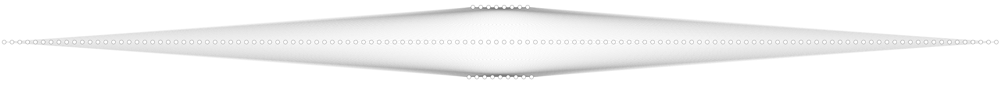
9 output nodes for the 9 actions

The below hyperparamater are very typical. Some of these hyperparamater values are from https://github.com/Bobingstern/gym-CarDrifting2D/tree/main

In [20]:
def initialise_training_model():
    return PPO_Model(state_dim = get_game_state_size(), # number of nodes in input layer, 8
              action_dim = 9,                     # number of nodes in output layer
              n_latent_var = 128,                 # number of nodes in hidden layer
              lr = 5e-4,                          # learning rate
              betas = (0.9, 0.999),
              gamma = 0.99,                       # discount factor
              K_epochs  = 4,                      # update policy for K epochs
              eps_clip = 0.2                      # clip parameter for PPO
             )

memory = PPO_Memory()
ppo_model = initialise_training_model()

### Training parameters

Before creating our training loop, we will need to specify the following training parametrs:

In [25]:
# Training parameters
game_count = 0 # Number of games played while training
max_games = 20000  # Total number of games to train on
max_gameLoops = 60 * 30 # End game early if max_gameLoops reached
total_gameLoops = 0 # total number of gameLoops (game steps) played
update_interval = 100 # update policy every n gameLoops

# Stats about agent's training performance
log_interval = 10 # plot training performance every 10 games
cumulative_reward = 0.0
highest_avg_reward = 0.0
game_numbers = []
game_rewards = []

### Training loop

We play 'max_games' number of games, in each game we:

**At the start of each game**
1. reset the game, and get its initial state
2. play the game for 'max_gameLoops' steps, or until the game is won/loss

**While playing the game**
1. Based on the current game state, use the model to select an action
2. Play one step of the game with the chosen action
3. Get the reward and if the game ended after playing the single game step
4. Get the new game state
6. Store the following as a new entry in memory:
    - The original game state
    - The action chosen
    - The probabilty of selecting that action
    - The reward received
    - If the game ended
6. Every 'update_interval' game steps:
    - Look through all entires in memory, and use this to train our network
    - Clear memory
7. End the game early if there is a win/loss or 'max_gameLoops' reached
  

**At the end of each game**
1. Every 'log_interval' number of games, we find the average total reward received and plot this.
2. If the average reward was a new record, we save the model

<Figure size 640x480 with 0 Axes>

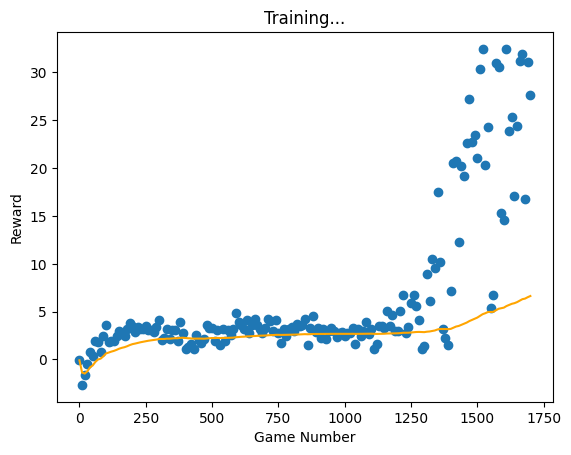

In [26]:
window = pygame.display.set_mode((screen_width, screen_height))
pygame.display.set_caption('Racing Game training')
memory.clear_memory()

# training loop
while playingGame and game_count < max_games:

    # Reset the game
    reset_game()
    state = get_game_state()

    # Keep track of the total reward for the game
    game_total_reward = 0

    while gameLoops < max_gameLoops:

        # Use old policy to choose action
        chosenAction = ppo_model.policy_old.act(state, memory)
        actions = np.zeros(9)
        actions[chosenAction] = 1

        # Play one game state with the chosen action, record the reward received and if the game ended
        reward, gameEnded = play_game_step(actions)

        # Record the new game state
        state = get_game_state()
       
        # Saving reward and gameEnded to memory
        memory.rewards.append(reward)
        memory.is_terminals.append(gameEnded)

        # Every update_interval, update the model
        total_gameLoops += 1
        if total_gameLoops % update_interval == 0:
            ppo_model.update(memory)
            memory.clear_memory()

        game_total_reward += reward
        
        if gameEnded:
            break

    # Keep track of agent's training performance
    cumulative_reward += game_total_reward
    if game_count % log_interval == 0:
        game_numbers += [game_count]
        avg_reward = cumulative_reward / log_interval
        game_rewards += [avg_reward]
        cumulative_reward = 0.0
        # Plot training performance
        plot_training(game_numbers, game_rewards)

        # Save model if new best average reward achieved
        if avg_reward > highest_avg_reward:
            highest_avg_reward = avg_reward
            path = "model/PPO-{}.pth"
            torch.save(ppo_model.policy.state_dict(), path.format("-training-best"))
            print("Model saved with average reward of:", avg_reward)

    game_count += 1
    
reset_game()
pygame.quit()

For example, these graphs snapshot the model's performance from a prior training attempt that ran for around 2,000 games.

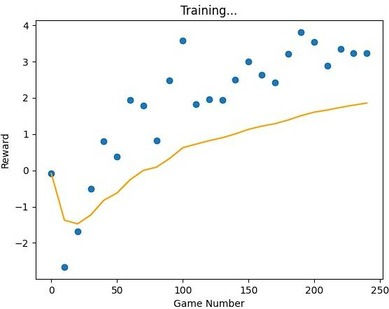 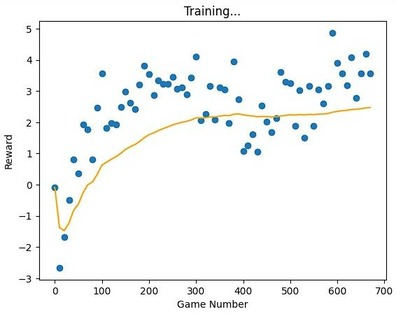 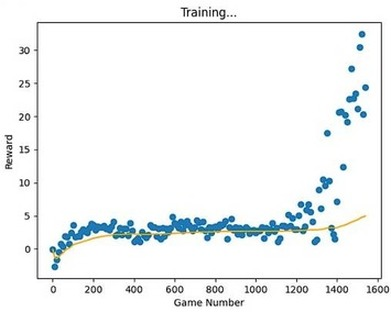

## Results!

### AI playing our game

We have now trained a model, now we just need to implement the model into our game so it choosen the actions instead of the user.

The models have been saved in the 'model/' folder. I have already trained a model for around 20,000 games: PPO-trained-best.pth

This is very simple to do, and takes just two steps:
1. We load the weights from out trained model
2. Instead of getting user input, we swap it out to use our newly trained model:
    - We collect the current game state
    - We pass this game state to our model and get the chosen action
  
I encourage you to run this code yourself, to watch the agent race!

In [23]:
window = pygame.display.set_mode((screen_width, screen_height))
pygame.display.set_caption('Racing Game trained')

ppo_model.policy_old.load_state_dict(torch.load("model/PPO-{}.pth".format("trained-best")))
ppo_model.policy_old.eval()

# Reset the game
reset_game()

# Basic game loop that runs for 60 seconds or until quit
while playingGame and gameLoops < 60 * 60:
    if any(event.type == pygame.QUIT for event in pygame.event.get()):
        playingGame = False
    gameLoops += 1

    # Project ray casts from car
    project_raycasts()

    # Throttle and Steering actions
    state = get_game_state()
    chosenAction = ppo_model.policy_old.act(state, None)
    actions = np.zeros(9)
    actions[chosenAction] = 1

    # Update the car's position
    update_car_position(actions)

    # Check collision with walls
    if check_for_wall_collision():
        print("Game lost! You hit a barrier.")
        reset_game()

    # Check collision with waypoints
    waypoint_index = check_for_waypoints_collision()
    if waypoint_index != -1:
        # If hit the next waypoint
        if waypoint_index == next_waypoint_index:
            next_waypoint_index += 1
            # Win if last waypoint hit
            if next_waypoint_index == len(scaled_waypoints):
                print("Game won! You completed a lap.")
                reset_game()

    # Draw the game to the screen
    draw_game()
    # Draw actions grid to the screen
    draw_actions(actions)
    # Draw raycasts on the screen
    draw_raycasts()
    
    # Display the screen on the window at 60 FPS
    window.blit(screen, (0, 0))
    pygame.display.flip()
    pygame.time.Clock().tick(60)

reset_game()
pygame.quit()

Game won! You completed a lap.
Game won! You completed a lap.
Game won! You completed a lap.
Game won! You completed a lap.
Game won! You completed a lap.
Game won! You completed a lap.


A recording of the trained agent racing, after training on around 20,000 games:

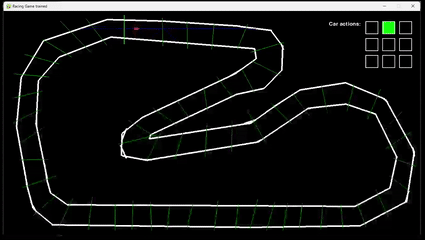

### Futher remarks

This agent is likely overfitted to the specific track used during training and may struggle on new tracks with unfamiliar turns or dimensions. If the objective is to excel on this particular track, overfitting might not be an issue. However, for developing a versatile racing car agent capable of handling a variety of tracks, it's crucial to train the agent on diverse tracks. Incorporating randomness in the training process can help mitigate predictability and promote a more generalized learning, for example with random start points.

In this tutorial, we didn't focus on the Reinforcement Learning (RL) algorithm implementations or the process of hyperparameter selection. The choice of algorithm and hyperparameter values largely depends on what you are making. It's important to explore the trade-offs among different RL algorithms available, such as SARSA, PPO, and DQNs, when designing your RL agent. As for hyperparameter tuning, experimentation is often required to discover effective values. Although hyperparameter optimization techniques exist, they may not always be practical due to the typically lengthy training times associated with RL models.

Additonally, it's important to mention that the code quality in this tutorial is intentially simple and sequential, for example classes have been avoided - you should design the game environment or the agent using classes in an actual implementation.

I hope this tutorial proves useful for developing your own reinforcement learning (RL) agent for a game, the process followed in the tutorial is a standard/typical approach that should be applicable to most games:
1. Create a game environment
2. Integrate an agent to your game with a set of actions
3. Define the Game State for every game step
4. Play the game one step at a time with rewards
5. Implement a RL model
6. Train the agent:
    - Observing the current game state
    - Choosing an action based on the model's policy
    - Executing the action
    - Receiving a reward based on the outcome
    - Updating the game state
    - Repeat
7. Use the trained model in your game

If you are particularly keen on crafting a reinforcement learning agent tailored to car racing games, check out one of my other projects. It's a physics-based AI car racer that was developed with this same workflow (but, not presented as a tutorial), utilizing Unity's ML-agents framework: https://github.com/Jonathon-A/AIDriver

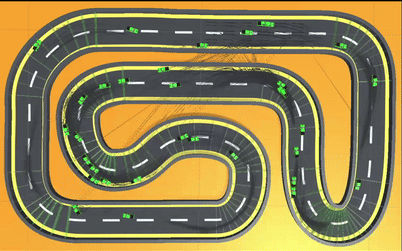

## References

1. gym-CarDrifting2D - Top Down Car Driving for Gym \
   https://github.com/Bobingstern/gym-CarDrifting2D/tree/main \
   Used for track coordinates and PPO hyperpramaters

2. PPO-PyTorch \
   https://github.com/nikhilbarhate99/PPO-PyTorch \
   Used for implementation of PPO

3. Teaching an AI to Play the Snake Game Using Reinforcement Learning! \
   https://medium.com/@nancy.q.zhou/teaching-an-ai-to-play-the-snake-game-using-reinforcement-learning-6d2a6e8f3b1c \
   Partly inspired tutorial structure

4. ChatGPT \
   https://chat.openai.com/ \
   Used to help improve some explanations in this tutorial